In [6]:

import nltk
import spacy
import sys
from spacy.lang.en import English
import en_core_web_sm
from nltk.corpus import wordnet as wn
from nltk.stem.wordnet import WordNetLemmatizer
 

nltk.download('stopwords')
nltk.download('wordnet')

1.14.0


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\AYAN\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\AYAN\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [7]:
df_train = pd.read_csv("/Users/kiwi/Downloads/Data Scientist/Edureka_Projects/archive/IMDB Dataset.csv")

df_train.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [8]:
def encode(text):
    if(text=='positive'):
        return 1
    elif(text=='negative'):
        return 0
    else:
        return 2

In [9]:
df_train['sentiment_encoded']=df_train['sentiment'].apply(encode)
df_train=df_train.drop('sentiment',axis=1)
df_train.head()

,review,sentiment_encoded
0,One of the other reviewers has mentioned that ...,1
1,A wonderful little production. <br /><br />The...,1
2,I thought this was a wonderful way to spend ti...,1
3,Basically there's a family where a little boy ...,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",1


In [12]:
df_train['review'] = df_train.review.apply(lambda x:x.lower()) 
df_train['review'] = df_train.review.apply(lambda x: ' '.join(word.strip(string.punctuation) for word in x.split()))  # remove all punctuations in headline


In [15]:
df_train['review_count'] = df_train.review.apply(lambda x: len(list(x.split())))
df_train['review_unique_word_count'] = df_train.review.apply(lambda x: len(set(x.split())))
df_train['review_has_digits'] = df_train.review.apply(lambda x: bool(re.search(r'\d', x)))
df_train

,review,sentiment_encoded,review_count,review_unique_word_count,review_has_digits
0,one of the other reviewers has mentioned that ...,1,307,191,True
1,a wonderful little production br br the filmin...,1,162,107,False
2,i thought this was a wonderful way to spend ti...,1,166,118,True
3,basically there's a family where a little boy ...,0,135,87,True
4,petter mattei's love in the time of money is a...,1,230,142,False
...,...,...,...,...,...
49995,i thought this movie did a down right good job...,1,194,118,True
49996,bad plot bad dialogue bad acting idiotic direc...,0,112,80,False
49997,i am a catholic taught in parochial elementary...,0,229,142,False
49998,i'm going to have to disagree with the previou...,0,212,150,True


In [ ]:
import tensorflow as tf
import pandas as pd
import string
import re
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

In [16]:

train_data, test_data = train_test_split(df_train[['review', 'sentiment_encoded']], test_size=0.1)  # randomly splitting 10% of dataset to be training dataset 

training_sentences = list(train_data['review'])
training_labels = list(train_data['sentiment_encoded'])

testing_sentences = list(test_data['review'])
testing_labels = list(test_data['sentiment_encoded'])
training_labels_final = np.array(training_labels)
testing_labels_final = np.array(testing_labels)

In [17]:
vocab_size = 10000   
embedding_dim = 16
max_length = 120
trunc_type='post'
oov_tok = "<OOV>"


from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(training_sentences)
padded = pad_sequences(sequences,maxlen=max_length, truncating=trunc_type)

testing_sequences = tokenizer.texts_to_sequences(testing_sentences)
testing_padded = pad_sequences(testing_sequences,maxlen=max_length)



In [18]:
sequences

[[1315,
  11,
  79,
  22,
  103,
  11,
  26,
  124,
  108,
  4,
  18,
  17,
  35,
  107,
  78,
  150,
  13,
  67,
  139,
  4,
  7827,
  213,
  35,
  3473,
  3933,
  7282,
  7,
  390,
  2,
  693,
  251,
  294,
  6,
  1382,
  4,
  1,
  213,
  9,
  4,
  18,
  17,
  2,
  323,
  662,
  3,
  291,
  511,
  10,
  13,
  7340,
  67,
  8,
  8,
  25,
  114,
  14,
  1395,
  6,
  7472,
  2,
  65,
  14,
  590,
  3,
  30,
  2,
  80,
  102,
  70,
  255,
  32,
  1626,
  150,
  2192,
  58,
  9146,
  582,
  1537,
  14,
  493,
  233,
  29,
  46,
  67,
  1956,
  398,
  517,
  6,
  586,
  25,
  2724,
  21,
  86,
  2,
  166,
  3,
  18,
  1098,
  2566,
  13,
  7282,
  14,
  1614,
  16,
  12,
  213,
  47,
  7,
  55,
  96,
  6,
  6535,
  8,
  8,
  25,
  109,
  4224,
  2,
  437,
  559,
  233,
  172,
  56,
  29,
  7,
  21,
  260,
  23,
  24,
  161,
  6249,
  16,
  2,
  3387,
  1504,
  6,
  7828,
  25,
  761,
  1858,
  3,
  29,
  7,
  446,
  6,
  27,
  2,
  604,
  11,
  59,
  22,
  450,
  291,
  21,
  12,
  28,
  3

In [19]:
padded

array([[1315,   11,   79, ...,    2,  437,  559],
       [5351, 2928,    7, ...,    5,    2,   65],
       [   2,  219, 4383, ...,    3,   34,   30],
       ...,
       [ 221,   63,   55, ...,  411,   31,   80],
       [   1,    7,   22, ...,    3,    4,   53],
       [1096,    2,    1, ...,    1,  229,    7]])

In [20]:
reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode_review(text):
    return ' '.join([reverse_word_index.get(i, '?') for i in text])

In [21]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Bidirectional(tf.keras.layers.GRU(32)),
    tf.keras.layers.Dense(100, kernel_regularizer=tf.keras.regularizers.l1(0.003), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l1(0.003), activation='sigmoid')
])
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 120, 16)           160000    
_________________________________________________________________
bidirectional (Bidirectional (No

In [22]:
num_epochs = 10
history = model.fit(padded, training_labels_final, epochs=num_epochs, batch_size=64, validation_data=(testing_padded, testing_labels_final))

Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 55s 1ms/sample - loss: 0.7135 - acc: 0.7478 - val_loss: 0.4158 - val_acc: 0.8486
Epoch 2/10
45000/45000 [==============================] - 55s 1ms/sample - loss: 0.3466 - acc: 0.8702 - val_loss: 0.4691 - val_acc: 0.8120
Epoch 3/10
45000/45000 [==============================] - 55s 1ms/sample - loss: 0.3009 - acc: 0.8916 - val_loss: 0.4533 - val_acc: 0.8216
Epoch 4/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.2589 - acc: 0.9107 - val_loss: 0.3958 - val_acc: 0.8552
Epoch 5/10
45000/45000 [==============================] - 58s 1ms/sample - loss: 0.2169 - acc: 0.9299 - val_loss: 0.4300 - val_acc: 0.8408
Epoch 6/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.1780 - acc: 0.9455 - val_loss: 0.5399 - val_acc: 0.8350
Epoch 7/10
45000/45000 [==============================] - 56s 1ms/sample - loss: 0.1448 - acc: 0.9598 - val_loss: 0.6

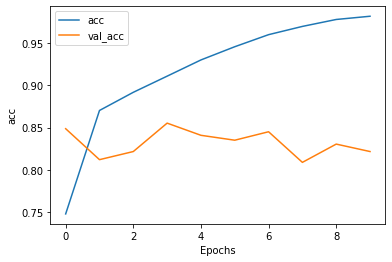

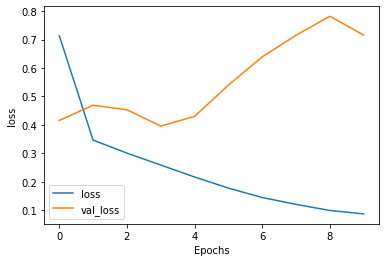

In [23]:
import matplotlib.pyplot as plt


def plot_graphs(history, string):
    plt.plot(history.history[string])
    plt.plot(history.history['val_'+string])
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend([string, 'val_'+string])
    plt.show()

plot_graphs(history, 'acc')
plot_graphs(history, 'loss')
plt.show()

In [24]:

model_L2 = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Bidirectional(tf.keras.layers.GRU(32)),
    tf.keras.layers.Dense(100, kernel_regularizer=tf.keras.regularizers.l2(0.003), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l2(0.003), activation='sigmoid')
])
model_L2.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model_L2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 64)                9408      
_________________________________________________________________
dense_2 (Dense)              (None, 100)               6500      
_________________________________________________________________
batch_normalization_1 (Batch (None, 100)               400       
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 101       
Total params: 176,409
Trainable params: 176,209
Non-trainable params: 200
______________________________________________

In [25]:
num_epochs = 10
history_2 = model_L2.fit(padded, training_labels_final, epochs=num_epochs, batch_size=64,  validation_data=(testing_padded, testing_labels_final))

Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 52s 1ms/sample - loss: 0.5283 - acc: 0.7536 - val_loss: 0.6400 - val_acc: 0.6962
Epoch 2/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.3156 - acc: 0.8712 - val_loss: 0.4535 - val_acc: 0.7950
Epoch 3/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.2656 - acc: 0.8942 - val_loss: 0.3769 - val_acc: 0.8554
Epoch 4/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.2167 - acc: 0.9167 - val_loss: 0.8241 - val_acc: 0.7490
Epoch 5/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.1735 - acc: 0.9351 - val_loss: 0.7129 - val_acc: 0.7682
Epoch 6/10
45000/45000 [==============================] - 58s 1ms/sample - loss: 0.1371 - acc: 0.9518 - val_loss: 0.5378 - val_acc: 0.8280
Epoch 7/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.1153 - acc: 0.9602 - val_loss: 1.4

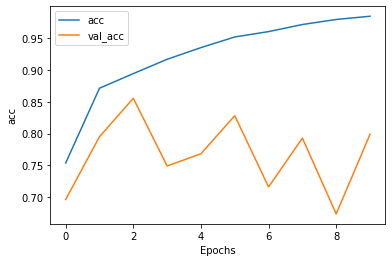

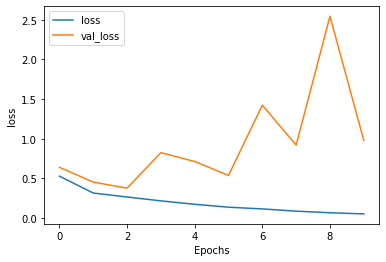

In [26]:
plot_graphs(history_2, 'acc')
plot_graphs(history_2, 'loss')
plt.show()

In [27]:

model_lstm = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(100, kernel_regularizer=tf.keras.regularizers.l1(0.003), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l1(0.003), activation='sigmoid')
])

model_lstm.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model_lstm.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
bidirectional_2 (Bidirection (None, 64)                12544     
_________________________________________________________________
dense_4 (Dense)              (None, 100)               6500      
_________________________________________________________________
batch_normalization_2 (Batch (None, 100)               400       
_________________________________________________________________
dropout_2 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 101       
Total params: 179,545
Trainable params: 179,345
Non-trainable params: 200
______________________________________________

In [35]:
num_epochs = 10
history_3 = model_lstm.fit(padded, training_labels_final, epochs=num_epochs, batch_size=64, validation_data=(testing_padded, testing_labels_final))


Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 65s 1ms/sample - loss: 0.6532 - acc: 0.7938 - val_loss: 0.4121 - val_acc: 0.8588
Epoch 2/10
45000/45000 [==============================] - 67s 1ms/sample - loss: 0.3387 - acc: 0.8737 - val_loss: 0.3470 - val_acc: 0.8682
Epoch 3/10
45000/45000 [==============================] - 64s 1ms/sample - loss: 0.2981 - acc: 0.8920 - val_loss: 0.4127 - val_acc: 0.8502
Epoch 4/10
45000/45000 [==============================] - 65s 1ms/sample - loss: 0.2609 - acc: 0.9088 - val_loss: 0.4525 - val_acc: 0.8496
Epoch 5/10
45000/45000 [==============================] - 65s 1ms/sample - loss: 0.2248 - acc: 0.9231 - val_loss: 0.4102 - val_acc: 0.8418
Epoch 6/10
45000/45000 [==============================] - 66s 1ms/sample - loss: 0.1886 - acc: 0.9410 - val_loss: 0.5320 - val_acc: 0.8498
Epoch 7/10
45000/45000 [==============================] - 66s 1ms/sample - loss: 0.1548 - acc: 0.9558 - val_loss: 0.5

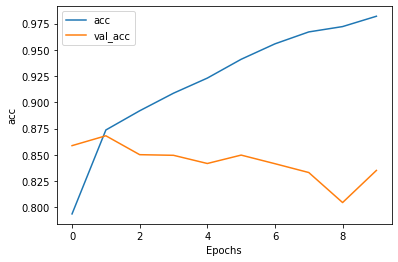

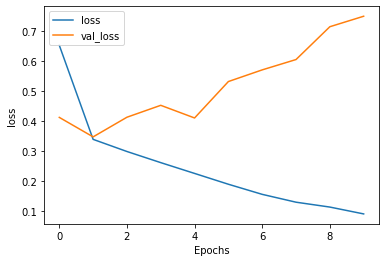

In [36]:
plot_graphs(history_3, 'acc')
plot_graphs(history_3, 'loss')
plt.show()

In [30]:

model_ridge_lstm = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(100, kernel_regularizer=tf.keras.regularizers.l2(0.003), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l2(0.003), activation='sigmoid')
])

model_ridge_lstm.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model_ridge_lstm.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
bidirectional_3 (Bidirection (None, 64)                12544     
_________________________________________________________________
dense_6 (Dense)              (None, 100)               6500      
_________________________________________________________________
batch_normalization_3 (Batch (None, 100)               400       
_________________________________________________________________
dropout_3 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 101       
Total params: 179,545
Trainable params: 179,345
Non-trainable params: 200
______________________________________________

In [34]:
num_epochs = 10
history_4 = model_ridge_lstm.fit(padded, training_labels_final, epochs=num_epochs, batch_size=64, validation_data=(testing_padded, testing_labels_final))


Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 66s 1ms/sample - loss: 0.4883 - acc: 0.7820 - val_loss: 0.3631 - val_acc: 0.8440
Epoch 2/10
45000/45000 [==============================] - 64s 1ms/sample - loss: 0.3099 - acc: 0.8738 - val_loss: 0.4569 - val_acc: 0.7860
Epoch 3/10
45000/45000 [==============================] - 64s 1ms/sample - loss: 0.2605 - acc: 0.8974 - val_loss: 0.3942 - val_acc: 0.8486
Epoch 4/10
45000/45000 [==============================] - 64s 1ms/sample - loss: 0.2116 - acc: 0.9199 - val_loss: 0.4211 - val_acc: 0.8438
Epoch 5/10
45000/45000 [==============================] - 65s 1ms/sample - loss: 0.1601 - acc: 0.9423 - val_loss: 0.4765 - val_acc: 0.8282
Epoch 6/10
45000/45000 [==============================] - 65s 1ms/sample - loss: 0.1159 - acc: 0.9610 - val_loss: 0.5717 - val_acc: 0.8162
Epoch 7/10
45000/45000 [==============================] - 65s 1ms/sample - loss: 0.0849 - acc: 0.9726 - val_loss: 0.7

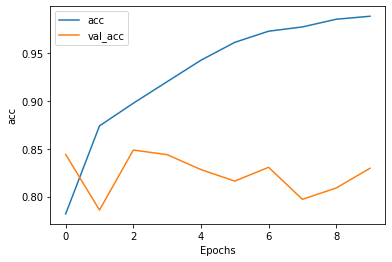

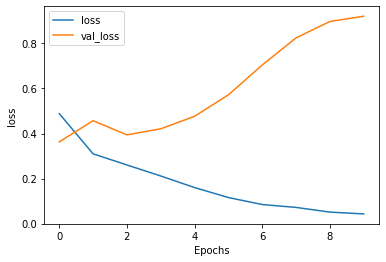

In [37]:
plot_graphs(history_4, 'acc')
plot_graphs(history_4, 'loss')
plt.show()

In [33]:

model_cnn = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(100, kernel_regularizer=tf.keras.regularizers.l1(0.003), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l1(0.003), activation='sigmoid')
])
model_cnn.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model_cnn.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
conv1d (Conv1D)              (None, 116, 128)          10368     
_________________________________________________________________
global_average_pooling1d (Gl (None, 128)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 100)               12900     
_________________________________________________________________
batch_normalization_4 (Batch (None, 100)               400       
_________________________________________________________________
dropout_4 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 1)                

In [38]:
num_epochs = 10
history_5 = model_cnn.fit(padded, training_labels_final, epochs=num_epochs, batch_size=64, validation_data=(testing_padded, testing_labels_final))


Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 13s 297us/sample - loss: 0.7054 - acc: 0.8146 - val_loss: 0.5302 - val_acc: 0.7586
Epoch 2/10
45000/45000 [==============================] - 11s 237us/sample - loss: 0.3452 - acc: 0.8717 - val_loss: 0.3727 - val_acc: 0.8550
Epoch 3/10
45000/45000 [==============================] - 11s 252us/sample - loss: 0.3175 - acc: 0.8824 - val_loss: 0.3900 - val_acc: 0.8464
Epoch 4/10
45000/45000 [==============================] - 11s 249us/sample - loss: 0.2994 - acc: 0.8889 - val_loss: 0.3907 - val_acc: 0.8458
Epoch 5/10
45000/45000 [==============================] - 12s 256us/sample - loss: 0.2857 - acc: 0.8957 - val_loss: 0.4184 - val_acc: 0.8366
Epoch 6/10
45000/45000 [==============================] - 12s 257us/sample - loss: 0.2796 - acc: 0.8967 - val_loss: 0.4776 - val_acc: 0.8216
Epoch 7/10
45000/45000 [==============================] - 11s 239us/sample - loss: 0.2713 - acc: 0.8993 -

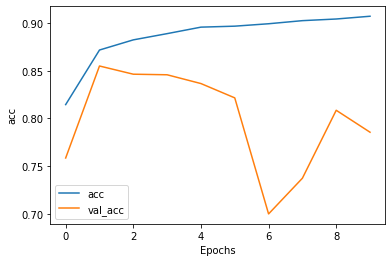

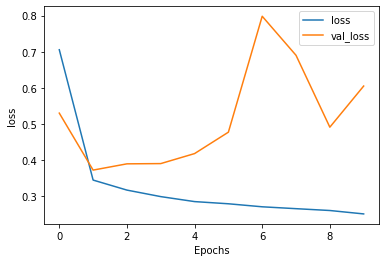

In [39]:
plot_graphs(history_5, 'acc')
plot_graphs(history_5, 'loss')
plt.show()

In [40]:

model_cnn_L2 = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Conv1D(128, 5, activation='relu'),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(100, kernel_regularizer=tf.keras.regularizers.l2(0.003), activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l2(0.003), activation='sigmoid')
])
model_cnn_L2.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model_cnn_L2.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 116, 128)          10368     
_________________________________________________________________
global_average_pooling1d_1 ( (None, 128)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               12900     
_________________________________________________________________
dropout_5 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 101       
Total params: 183,369
Trainable params: 183,369
Non-trainable params: 0
________________________________________________

In [41]:
num_epochs = 10
history_6 = model_cnn_L2.fit(padded, training_labels_final, epochs=num_epochs, batch_size=64, validation_data=(testing_padded, testing_labels_final))


Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 11s 233us/sample - loss: 0.4760 - acc: 0.7949 - val_loss: 0.3476 - val_acc: 0.8622
Epoch 2/10
45000/45000 [==============================] - 11s 246us/sample - loss: 0.3236 - acc: 0.8768 - val_loss: 0.3443 - val_acc: 0.8620
Epoch 3/10
45000/45000 [==============================] - 11s 250us/sample - loss: 0.2913 - acc: 0.8917 - val_loss: 0.3481 - val_acc: 0.8622
Epoch 4/10
45000/45000 [==============================] - 10s 229us/sample - loss: 0.2692 - acc: 0.9037 - val_loss: 0.3598 - val_acc: 0.8608
Epoch 5/10
45000/45000 [==============================] - 11s 250us/sample - loss: 0.2539 - acc: 0.9104 - val_loss: 0.3597 - val_acc: 0.8612
Epoch 6/10
45000/45000 [==============================] - 11s 256us/sample - loss: 0.2379 - acc: 0.9183 - val_loss: 0.3648 - val_acc: 0.8562
Epoch 7/10
45000/45000 [==============================] - 11s 241us/sample - loss: 0.2231 - acc: 0.9256 -

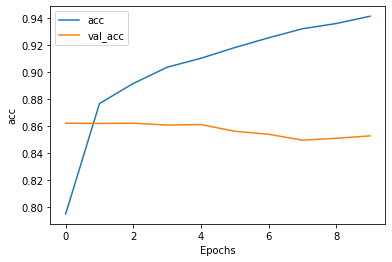

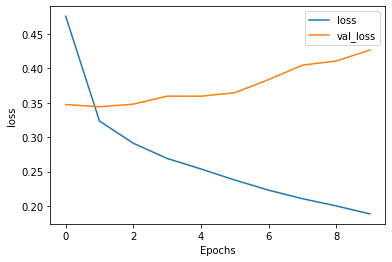

In [42]:
plot_graphs(history_6, 'acc')
plot_graphs(history_6, 'loss')
plt.show()

In [43]:
# Combination of CNN-RNN (LSTM)
# Output from CNN with Conv1D is used as input for RNN with LSTM (with Lasso Regularization, Dropout)

In [44]:
# Model Definition with CNN (Conv1D)
model_cnn_rnn = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Conv1D(128, 1, activation='relu'),
    tf.keras.layers.MaxPooling1D(2, padding="same"),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    tf.keras.layers.Dense(100, kernel_regularizer=tf.keras.regularizers.l1(0.005), activation='relu'),
    # tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1, kernel_regularizer=tf.keras.regularizers.l1(0.005), activation='sigmoid')
])
model_cnn_rnn.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
model_cnn_rnn.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_6 (Embedding)      (None, 120, 16)           160000    
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 120, 128)          2176      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 60, 128)           0         
_________________________________________________________________
bidirectional_4 (Bidirection (None, 64)                41216     
_________________________________________________________________
dense_12 (Dense)             (None, 100)               6500      
_________________________________________________________________
dropout_6 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 1)                

In [45]:
num_epochs = 10
history_7 = model_cnn_rnn.fit(padded, training_labels_final, epochs=num_epochs, batch_size=64, validation_data=(testing_padded, testing_labels_final))


Train on 45000 samples, validate on 5000 samples
Epoch 1/10
45000/45000 [==============================] - 58s 1ms/sample - loss: 0.9919 - acc: 0.5067 - val_loss: 0.6972 - val_acc: 0.4920
Epoch 2/10
45000/45000 [==============================] - 65s 1ms/sample - loss: 0.6971 - acc: 0.5004 - val_loss: 0.6971 - val_acc: 0.4920
Epoch 3/10
45000/45000 [==============================] - 63s 1ms/sample - loss: 0.6971 - acc: 0.5009 - val_loss: 0.6971 - val_acc: 0.4920
Epoch 4/10
45000/45000 [==============================] - 62s 1ms/sample - loss: 0.6971 - acc: 0.4969 - val_loss: 0.6970 - val_acc: 0.4920
Epoch 5/10
45000/45000 [==============================] - 57s 1ms/sample - loss: 0.6971 - acc: 0.4988 - val_loss: 0.6971 - val_acc: 0.4920
Epoch 6/10
45000/45000 [==============================] - 60s 1ms/sample - loss: 0.6970 - acc: 0.5005 - val_loss: 0.6972 - val_acc: 0.4920
Epoch 7/10
45000/45000 [==============================] - 59s 1ms/sample - loss: 0.6971 - acc: 0.4983 - val_loss: 0.6

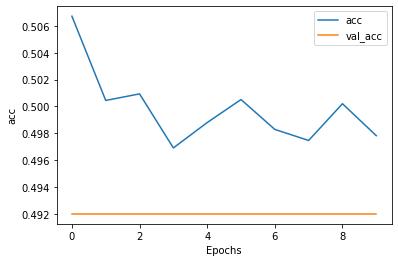

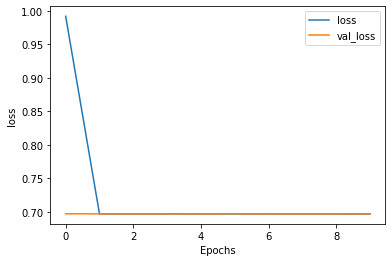

In [48]:
plot_graphs(history_7, 'acc')
plot_graphs(history_7, 'loss')
plt.show()

In [49]:

df = pd.read_csv("Extracted_Json.csv")
df = df[['text']]
df.head()

,text
0,fencing of riat market in kanyikela ward.\n\nm...
1,"VILNIUS, Jun 05, BNS - Visitors from low-risk ..."
2,"Every year, Georgia yard sale shoppers spend t..."
3,Adults have an opportunity to model good onlin...
4,"Company : OFFICE OF XINHE SUB-DISTRICT OFFICE,..."


In [50]:
df['text'] = df.text.apply(lambda x:x.lower()) 
df['text'] = df.text.apply(lambda x: ' '.join(word.strip(string.punctuation) for word in x.split()))  


In [51]:
df['text_count'] = df.text.apply(lambda x: len(list(x.split())))
df['text_unique_word_count'] = df.text.apply(lambda x: len(set(x.split())))
df['text_has_digits'] = df.text.apply(lambda x: bool(re.search(r'\d', x)))
df

,text,text_count,text_unique_word_count,text_has_digits
0,fencing of riat market in kanyikela ward more ...,37,31,True
1,vilnius jun 05 bns visitors from low-risk cou...,164,119,True
2,every year georgia yard sale shoppers spend th...,69,58,True
3,adults have an opportunity to model good onlin...,2173,749,True
4,company office of xinhe sub-district office p...,291,134,True
...,...,...,...,...
1995,according to kmov.com](http://kmov.com an arre...,100,66,True
1996,pelham  for parent daniela deluca the farewel...,590,276,True
1997,christine blackburne the associated press phex...,27,23,False
1998,renewal of sports hall floor viktoria elementa...,41,36,True


In [52]:
training_sentences = list(df['text'])


In [53]:
vocab_size = 10000  
embedding_dim = 16
max_length = 120
trunc_type='post'
oov_tok = "<OOV>"


from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(training_sentences)
padded = pad_sequences(sequences,maxlen=max_length, truncating=trunc_type)



In [54]:
sequences

[[8138,
  4,
  1,
  240,
  7,
  1,
  3149,
  33,
  571,
  247,
  5464,
  624,
  91,
  200,
  34,
  141,
  138,
  5464,
  141,
  219,
  369,
  264,
  231,
  101,
  234,
  4,
  1,
  1955,
  264,
  231,
  193,
  137,
  488,
  1575,
  1,
  1,
  1,
  1955,
  101,
  618,
  328,
  567],
 [5251,
  325,
  412,
  3471,
  2313,
  17,
  528,
  303,
  863,
  697,
  2,
  1248,
  1375,
  194,
  30,
  15,
  630,
  5,
  328,
  5252,
  84,
  2,
  1,
  7623,
  62,
  2214,
  3888,
  8717,
  2176,
  830,
  1,
  1,
  20,
  11,
  356,
  671,
  1425,
  5,
  659,
  4216,
  8,
  509,
  138,
  1,
  23,
  44,
  179,
  22,
  81,
  166,
  1315,
  30,
  5,
  1284,
  1696,
  1193,
  5,
  1,
  17,
  509,
  863,
  4,
  528,
  9395,
  303,
  71,
  20,
  7,
  6,
  438,
  482,
  1,
  1598,
  111,
  2278,
  98,
  25,
  8718,
  358,
  905,
  4,
  3150,
  2176,
  4106,
  676,
  11,
  356,
  94,
  5,
  2,
  8717,
  830,
  2,
  1248,
  786,
  3,
  2,
  1248,
  245,
  8,
  554,
  2177,
  3,
  265,
  136,
  2910,
  811,
  835,
 

In [55]:
padded

array([[   0,    0,    0, ...,  618,  328,  567],
       [5251,  325,  412, ..., 3150,  863,   26],
       [   0,    0,    0, ...,  538,   54,    1],
       ...,
       [   0,    0,    0, ...,    6,   55,    1],
       [   0,    0,    0, ...,  274,   30,  648],
       [9914, 1647,  101, ..., 1472,  510,  581]])

In [56]:
reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode_review(text):
    return ' '.join([reverse_word_index.get(i, '?') for i in text])

In [60]:


list_pred=model_L2.predict(padded).tolist()

In [61]:
list_pred

[[0.0044963061809539795],
 [6.0111284255981445e-05],
 [0.6293179392814636],
 [7.748603820800781e-07],
 [0.0],
 [1.2755393981933594e-05],
 [0.005073368549346924],
 [0.7074040174484253],
 [0.0011546313762664795],
 [0.987677276134491],
 [0.0],
 [0.03668740391731262],
 [0.00029161572456359863],
 [0.0017379522323608398],
 [0.01339218020439148],
 [8.642673492431641e-07],
 [0.9972641468048096],
 [9.426474571228027e-05],
 [0.6911413073539734],
 [0.00040471553802490234],
 [0.014277845621109009],
 [0.9993826150894165],
 [3.5762786865234375e-07],
 [0.039119333028793335],
 [0.020474106073379517],
 [0.000865250825881958],
 [0.0],
 [1.817941665649414e-06],
 [0.0028315186500549316],
 [0.012389153242111206],
 [0.7977136373519897],
 [0.01776432991027832],
 [0.9876697063446045],
 [0.00012961030006408691],
 [0.993954062461853],
 [0.04202553629875183],
 [0.0],
 [0.00027865171432495117],
 [7.316470146179199e-05],
 [0.0741969645023346],
 [0.9954034090042114],
 [0.0022443830966949463],
 [0.001024872064590454

In [63]:
sentiment=[]

for i in list_pred:
    if(i[0]<0.01):
        sentiment.append('negetive')
    else:
        sentiment.append('positive')
        
sentiment

['negetive',
 'negetive',
 'positive',
 'negetive',
 'negetive',
 'negetive',
 'negetive',
 'positive',
 'negetive',
 'positive',
 'negetive',
 'positive',
 'negetive',
 'negetive',
 'positive',
 'negetive',
 'positive',
 'negetive',
 'positive',
 'negetive',
 'positive',
 'positive',
 'negetive',
 'positive',
 'positive',
 'negetive',
 'negetive',
 'negetive',
 'negetive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negetive',
 'positive',
 'positive',
 'negetive',
 'negetive',
 'negetive',
 'positive',
 'positive',
 'negetive',
 'negetive',
 'positive',
 'positive',
 'negetive',
 'negetive',
 'negetive',
 'positive',
 'positive',
 'positive',
 'negetive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negetive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negetive',
 'positive',
 'negetive',
 'positive',
 'positive',
 'negetive',
 'negetive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negetive',
 'positive',

In [64]:
df['sentiment_score']=list_pred
df['sentiment']=sentiment

In [65]:
df.head()

,text,text_count,text_unique_word_count,text_has_digits,sentiment_score,sentiment
0,fencing of riat market in kanyikela ward more ...,37,31,True,[0.0044963061809539795],negetive
1,vilnius jun 05 bns visitors from low-risk cou...,164,119,True,[6.0111284255981445e-05],negetive
2,every year georgia yard sale shoppers spend th...,69,58,True,[0.6293179392814636],positive
3,adults have an opportunity to model good onlin...,2173,749,True,[7.748603820800781e-07],negetive
4,company office of xinhe sub-district office p...,291,134,True,[0.0],negetive
...,...,...,...,...,...,...
1995,according to kmov.com](http://kmov.com an arre...,100,66,True,[0.2508277893066406],positive
1996,pelham  for parent daniela deluca the farewel...,590,276,True,[0.5525146126747131],positive
1997,christine blackburne the associated press phex...,27,23,False,[0.0036520659923553467],negetive
1998,renewal of sports hall floor viktoria elementa...,41,36,True,[0.0011439323425292969],negetive
